# Image-processing code to match images in mean luminance, RMS contrast, and/or generate phase-scrambled versions
begun 27-08-2021
- TODO: implement phase-scrambling

In [1]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
# from skimage import exposure
# from skimage.exposure import match_histograms
import cv2

In [2]:
%matplotlib inline

In [3]:
# Slightly adapted from code at:
# https://stackoverflow.com/questions/32655686/histogram-matching-of-two-images-in-python-2-x
    
def hist_match(source, t_values, t_counts):
    """
    Adjust the pixel values of a grayscale image such that its histogram
    matches that of a target image

    Arguments:
    -----------
        source: np.ndarray
            Image to transform; the histogram is computed over the flattened
            array
        t_values: pixel values in target histogram
        t_counts: counts of those pixel values in target histogram
    Returns:
    -----------
        matched: np.ndarray
            The transformed output image
    """

    oldshape = source.shape
    source = source.ravel()

    # get the set of unique pixel values and their corresponding indices and
    # counts
    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True,
                                            return_counts=True)

    # take the cumsum of the counts and normalize by the number of pixels to
    # get the empirical cumulative distribution functions for the source and
    # template images (maps pixel value --> quantile)
    s_quantiles = np.cumsum(s_counts).astype(np.float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]

    # interpolate linearly to find the pixel values in the template image
    # that correspond most closely to the quantiles in the source image
    interp_t_values = np.interp(s_quantiles, t_quantiles, t_values)

    return interp_t_values[bin_idx].reshape(oldshape)


def ecdf(x):
    """convenience function for computing the empirical CDF"""
    vals, counts = np.unique(x, return_counts=True)
    ecdf = np.cumsum(counts).astype(np.float64)
    ecdf /= ecdf[-1]
    return vals, ecdf

---

## Point to image directory and load all images

In [4]:
imdir = './stimulus_sets/sample_set_20220608/'

In [15]:
# find image files that have not already been contrast matched (for example)
im_files = glob.glob(os.path.join(imdir,'*relief.png'))
im_files

['./stimulus_sets/sample_set_20220608\\bumps_MuirWood_gloss_0.60cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_gloss_0.92cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_gloss_1.40cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_gloss_2.14cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_gloss_3.27cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_gloss_5.00cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_matte_0.60cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_matte_0.92cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_matte_1.40cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_matte_2.14cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_matte_3.27cm_relief.png',
 './stimulus_sets/sample_set_20220608\\bumps_MuirWood_matte_5.00cm_relief.png',
 './stimulus_sets/sample_set_20220608\\b

In [16]:
# load those files in a list
# nb. "converting" to greyscale here just collapses them to a single channel if already greyscale
images = [cv2.cvtColor(cv2.imread(file), cv2.COLOR_RGB2GRAY)/255 for file in im_files]

## OPTION 1 (seems best): Match histograms

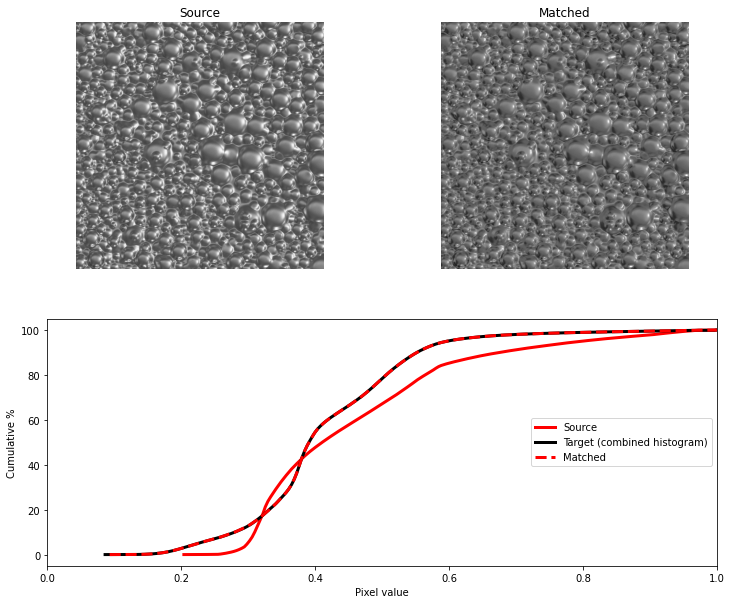

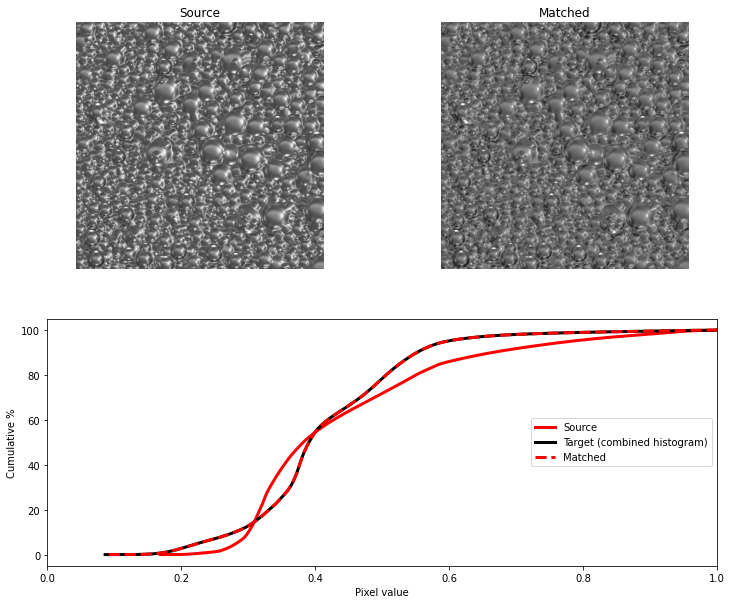

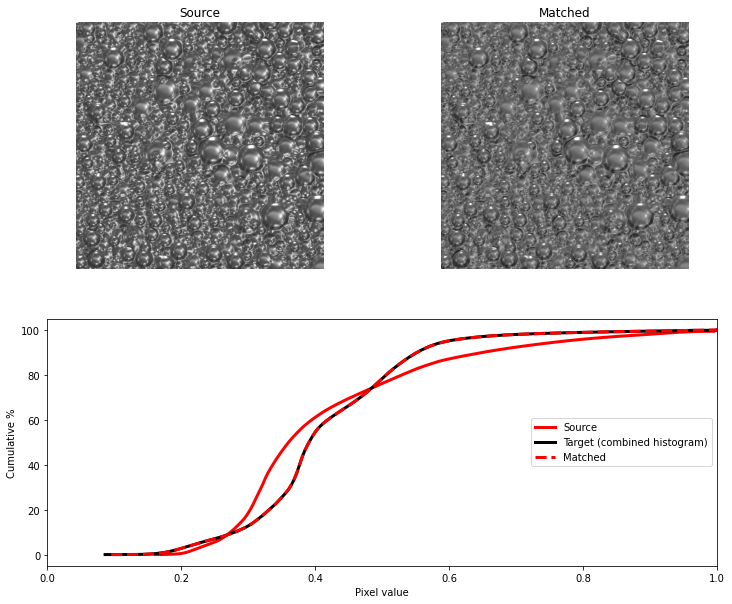

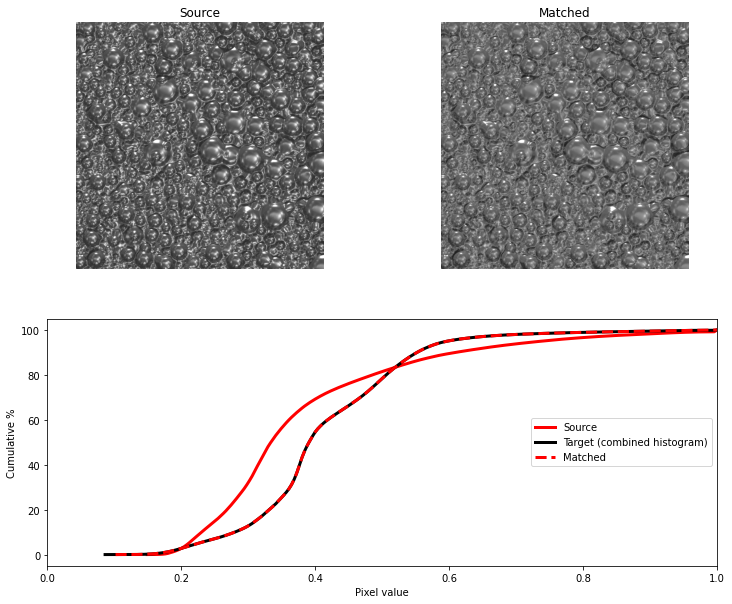

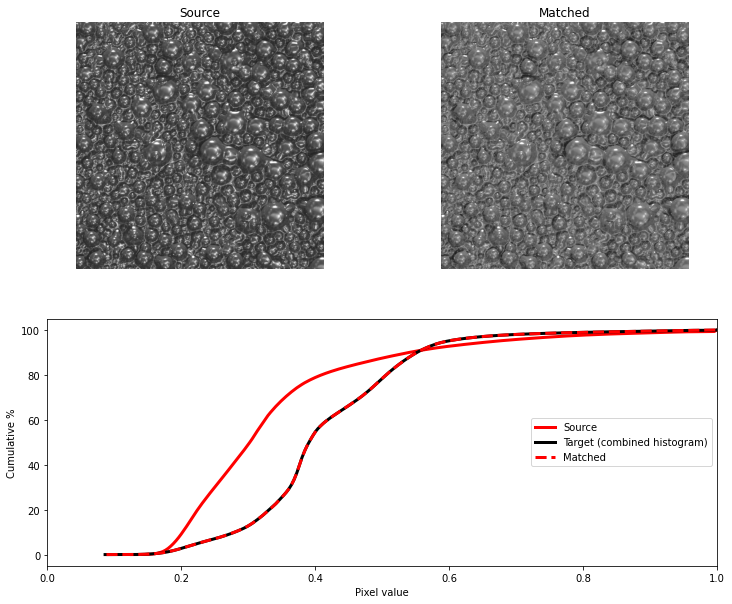

...

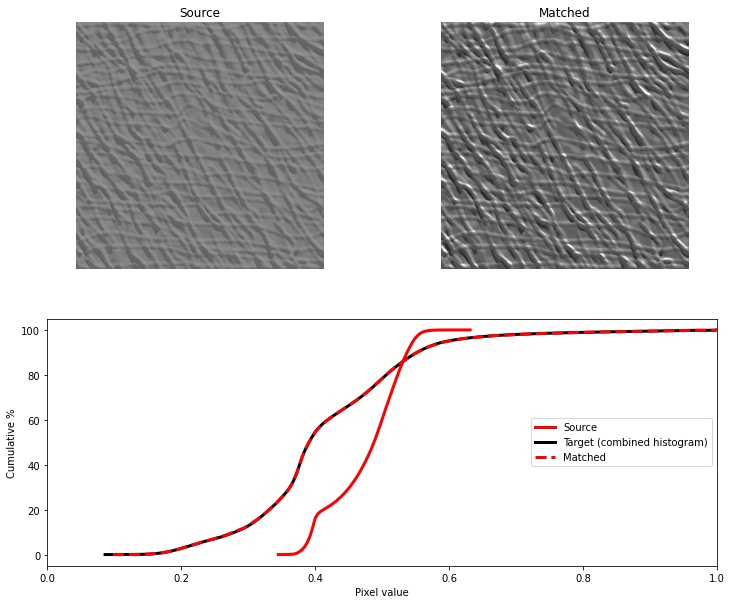

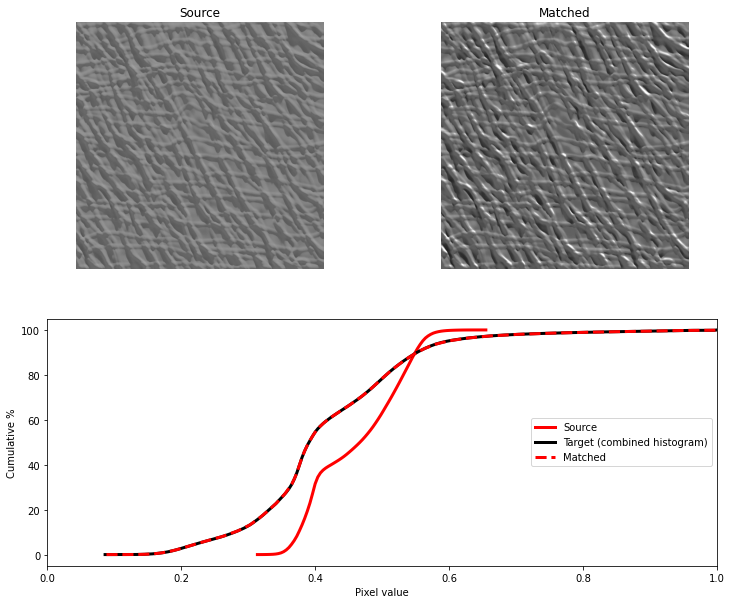

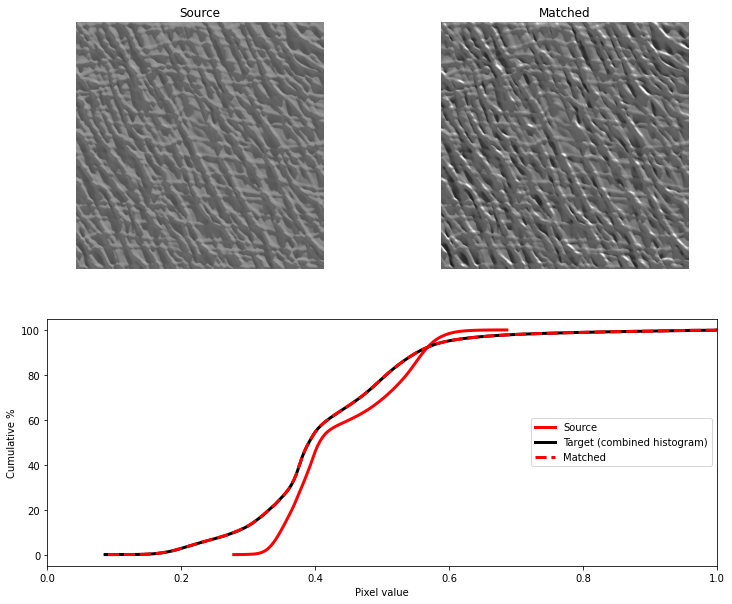

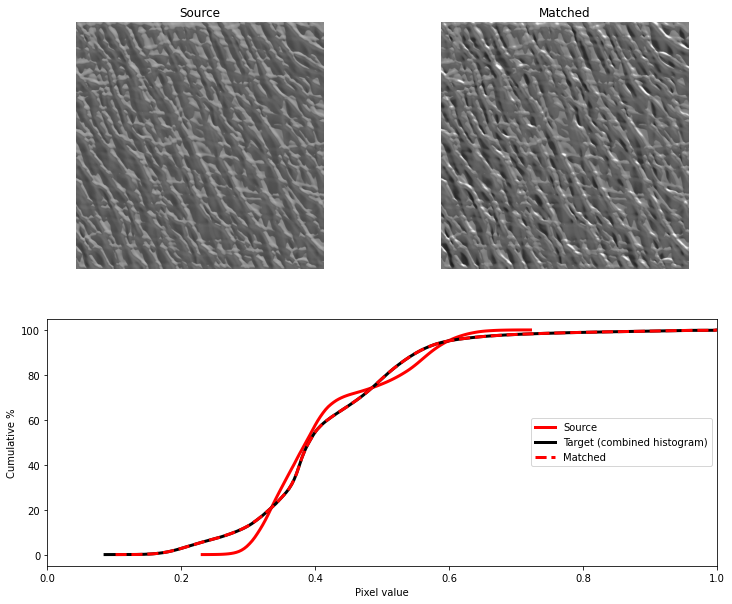

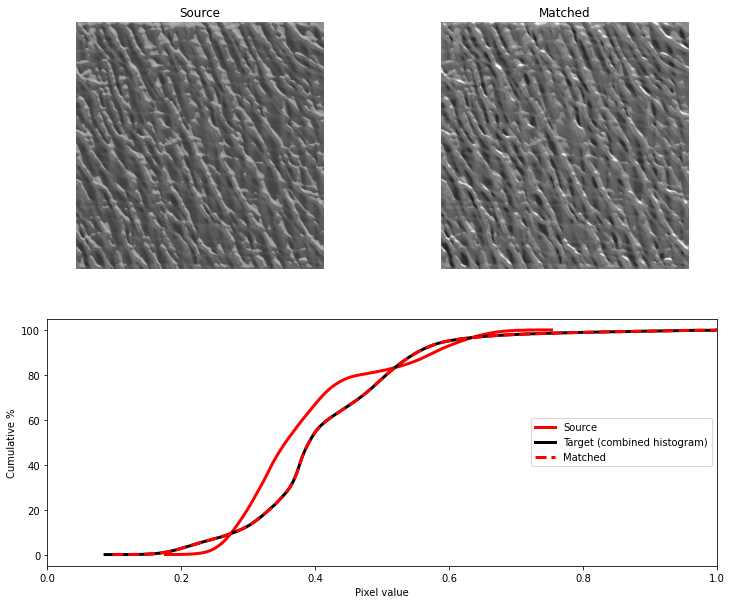

In [10]:
# Specify histogram to match:
# here I'm constructing a single histogram from
# all the pixels of all the images; I think this 
# equates to matching the average histogram across images
t_values, t_counts = np.unique(np.array(images).ravel(), return_counts=True)

# cycle through matching each image to this histogram
for count in range(len(images)):
    
    # match this image to the target all-images-combined histogram
    matched = hist_match(images[count], t_values, t_counts)

    # save the image in correct format
    rgb_im = np.array(matched*255.0, dtype=np.uint8)
    rgb_im = cv2.cvtColor(rgb_im, cv2.COLOR_GRAY2RGB)
    cv2.imwrite(os.path.join(imdir,'_'+im_files[count].split("\\")[-1][0:-4]+'_GreyscaleHistogramMatched.png'), rgb_im)
    
    # everything below is just for visualisation:
    x1, y1 = ecdf(images[count].ravel())
    x2, y2 = ecdf(np.array(images).ravel())
    x3, y3 = ecdf(matched.ravel())

    fig = plt.figure(figsize=(12,10))
    gs = plt.GridSpec(2, 2)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1], sharex=ax1, sharey=ax1)
    ax3 = fig.add_subplot(gs[1, :])
    for aa in (ax1, ax2):
        aa.set_axis_off()

    ax1.imshow(images[count], cmap=plt.cm.gray, vmin=0.0, vmax=1.0)
    ax1.set_title('Source')
    ax2.imshow(matched, cmap=plt.cm.gray, vmin=0.0, vmax=1.0)
    ax2.set_title('Matched')

    ax3.plot(x1, y1 * 100, '-r', lw=3, label='Source')
    ax3.plot(x2, y2 * 100, '-k', lw=3, label='Target (combined histogram)')
    ax3.plot(x3, y3 * 100, '--r', lw=3, label='Matched')
    ax3.set_xlim([0, 1])
    ax3.set_xlabel('Pixel value')
    ax3.set_ylabel('Cumulative %')
    ax3.legend(loc=5)
    plt.show()

## OPTION 2 (previous method): Match mean luminance and RMS contrast
RMS contrast definition: Standard Deviation of pixel intensities, assuming intensities have black-white range of 0-1

In [13]:
# first rescale all images into the range 0.33-0.66 to avoid subsequent clipping after mean shifting
scaled_images = []
for im in images:
    _im = im - im.min() # make lowest value 0
    _im = _im/(3*_im.max()) # make highest value 0.66
    _im = _im + 0.33 # shift everything up by 0.33
    scaled_images.append(_im)

In [ ]:
# calculate the original mean luminance and RMS contrast of each image
mean_lum_list = [im.mean() for im in scaled_images]
rms_list = [im.std() for im in scaled_images]

# now generate a version where those values are normalised to match the mean across original images
count = 0

# new_mean = 0.3 # experiment with fixed values
# new_std = 0.05

for im in images:
    
    # OPTION 1: match to existing values in dataset
    # normalise mean luminance to match set of images
    _im = im - (im.mean()-np.mean(mean_lum_list))
    new_mean = _im.mean()

    # normalise RMS contrast to match set of images
    _im = _im - _im.mean()
    _im = _im/(_im.std()/np.mean(rms_list))
    _im = _im + new_mean
    
    # rescale into range 0-1
#     if _im.min() < 0:
#         _im = _im + np.abs(_im.min())
#     _im = _im/_im.max()
    
#     # OPTION 2: match to prespecified values
#     _im = im - (im.mean()-new_mean)
#     _im = _im - new_mean
#     _im = _im/(_im.std()/new_std)
#     _im = _im + new_mean
    
    fig, axes = plt.subplots(1,2, figsize=(10,5))
    
    axes[0].imshow(im, cmap='gray', vmin=0, vmax=1)
    axes[0].set_title('mean: {}, contrast: {}'.format(np.round(im.mean(),3), np.round(im.std(),3)))
    axes[0].axis('off')
    
    axes[1].imshow(_im, cmap='gray', vmin=0, vmax=1)
    axes[1].set_title('mean: {}, contrast: {}'.format(np.round(_im.mean(),3), np.round(_im.std(),3)))
    axes[1].axis('off')
    
    plt.suptitle('ORIGINAL  <<<   {}   >>>   NORMALISED'.format(im_files[count].split("\\")[-1]), fontsize=15)
    plt.show()
    
    rgb_im = np.array(_im*255.0, dtype=np.uint8)
    rgb_im = cv2.cvtColor(rgb_im, cv2.COLOR_GRAY2RGB)
#     cv2.imwrite(os.path.join(imdir,im_files[count].split("\\")[-1][0:-4]+'_GreyscaleContrastMatched.png'), rgb_im)
    
    count+=1